This is our self-designed deep learning model, 
which combines both neural network and linear regression components for joint training.
We first established a DNN model, configured its parameters, then created a linear regression model. 
Subsequently, we conducted joint training by combining these two models. 
In the end, we observed that the accuracy of the models improved, 
when suitable weights were assigned to them.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
file = '.\concrete_mix_design_simplified.csv'
df = pd.read_csv(file)
df = df[df['age'] >= 28]
columns_to_drop = ['probe_index', 'name', 'weight_fresh', 'weight_at_test', 'size_x', 'size_y', 'size_z', 'age','slump.1']
df = df.drop(columns=columns_to_drop)
###############################################################################################    
target_column= 'compressive_strength'
target_column1 = 'slump'

The following code reads the data and performs preprocessing using our 'data_processing' file. 
When the 'Variance' in the bottom image is greater than 20, it's often advisable to rerun the 'data_processing' function. 
This is because the columns with somehow important regression relationships might have been removed.

best_params are: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
useless_feature: ['q_airentrain', 'q_non_crushed_sand', 'CEM_id_CEM_III', 'q_waterproofing', 'CEM_id_CEM_IV', 'q_retardant']


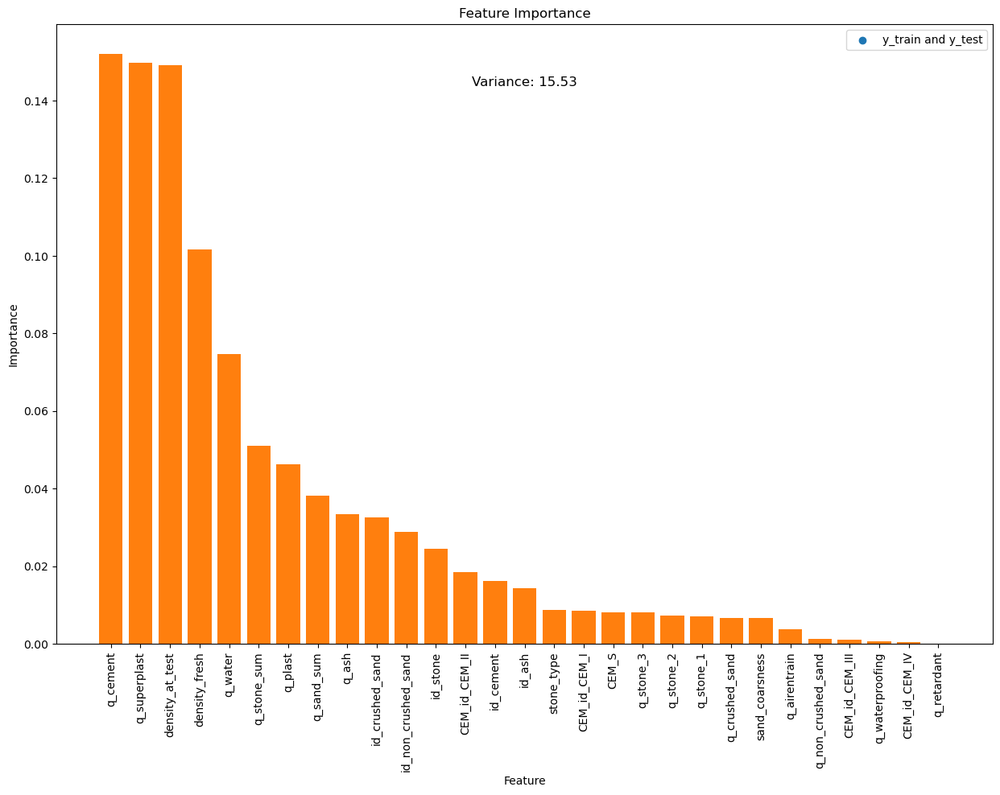

best_params are: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
useless_feature: ['q_airentrain', 'q_non_crushed_sand', 'CEM_id_CEM_III', 'CEM_id_CEM_IV', 'q_waterproofing', 'q_retardant']


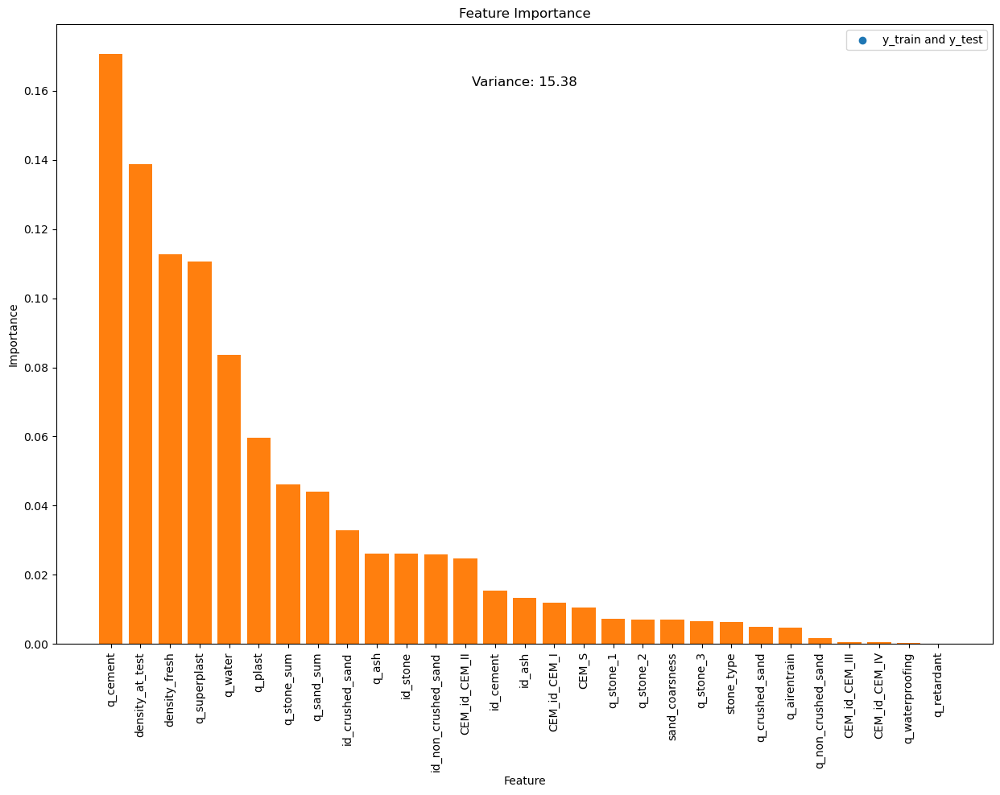

In [3]:
from data_analysis import data_processing
df = data_processing(df, target_column, target_column1)

In [4]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
X = df.drop('compressive_strength',axis=1)
y = df['compressive_strength']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2)

In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Converting the data into tensors.
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)

# Converting the target variable into a tensor and adding an additional dimension.
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 1)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1)

In [6]:
import plotly.graph_objects as go
# Define the Deep Neural Network (DNN) Model
class DNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(DNNModel, self).__init__()
        self.layer1 = nn.Linear(input_dim, hidden_dim)
        self.layer2 = nn.Linear(hidden_dim, hidden_dim)
        self.layer3 = nn.Linear(hidden_dim, output_dim)
        self.activation = nn.ReLU()

    def forward(self, x):
        x = self.activation(self.layer1(x))
        x = self.activation(self.layer2(x))
        x = self.layer3(x)
        return x

# Define input dimensions, hidden dimensions, and output dimensions
input_dim = X_train.shape[1]
hidden_dim = 30
output_dim = 1

# Create an instance of the DNNModel
dnn_model = DNNModel(input_dim, hidden_dim, output_dim)

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(dnn_model.parameters(), lr=0.005, weight_decay=0.001, 
                       betas=(0.9, 0.999), eps=1e-08, amsgrad=False)

# Define training parameters
epochs = 1000
batch_size = 64
losses = []

# Training loop
for epoch in range(epochs):
    # Split the training set into mini-batches
    for i in range(0, len(X_train_tensor), batch_size):
        inputs = X_train_tensor[i:i+batch_size]
        targets = y_train_tensor[i:i+batch_size]

        # Forward pass
        outputs = dnn_model(inputs)
        loss = criterion(outputs, targets)
        losses.append(loss.item())
        
        # Backpropagation and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Print loss every 100 epochs
    if epoch % 100 == 0:
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}")

# Convert the range to a list for plotting
epoch_list = list(range(epochs))

# Create the figure and add the loss trace
fig = go.Figure()
fig.add_trace(go.Scatter(x=epoch_list, y=losses, mode='lines', name='Loss'))

# Update layout and show the figure
fig.update_layout(title='Loss Curve', xaxis_title='Epochs', yaxis_title='Loss')
fig.show()

Epoch [1/1000], Loss: 525.3497
Epoch [101/1000], Loss: 11.1982
Epoch [201/1000], Loss: 7.6360
Epoch [301/1000], Loss: 6.7677
Epoch [401/1000], Loss: 6.1887
Epoch [501/1000], Loss: 6.5986
Epoch [601/1000], Loss: 6.3347
Epoch [701/1000], Loss: 5.7731
Epoch [801/1000], Loss: 5.4361
Epoch [901/1000], Loss: 5.1508


In [7]:
y_pred = dnn_model(X_test_tensor)
mse = mean_squared_error(y_test_tensor, y_pred.detach().numpy())
print(f"均方误差 (MSE): {mse:.4f}")

均方误差 (MSE): 18.3386


In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
import plotly.graph_objects as go

# Define the Polynomial Model
class PolyModel(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(PolyModel, self).__init__()
        self.layer = nn.Linear(input_dim, output_dim)

    def forward(self, x):
        return self.layer(x)

# Initialize model parameters
input_dim = X_train.shape[1]
hidden_dim = 40
output_dim = 1
# Create instances of the DNN and Polynomial models
dnn_model = DNNModel(input_dim, hidden_dim, output_dim)
poly_model = PolyModel(input_dim, output_dim)

# Define the loss function and optimizers for both models
criterion = nn.MSELoss()
dnn_optimizer = optim.Adam(dnn_model.parameters(), lr=0.005, weight_decay=0.001, betas=(0.9, 0.999), eps=1e-08, amsgrad=False)
poly_optimizer = optim.Adam(poly_model.parameters(), lr=0.005, weight_decay=0.001, betas=(0.9, 0.999), eps=1e-08, amsgrad=False)

epochs = 1000
batch_size = 32
losses = []

# Training loop
for epoch in range(epochs):
    # Split the training set into mini-batches
    for i in range(0, len(X_train_tensor), batch_size):
        inputs = X_train_tensor[i:i+batch_size]
        targets = y_train_tensor[i:i+batch_size]

        # Forward pass through both models
        dnn_outputs = dnn_model(inputs)
        poly_outputs = poly_model(inputs)
        outputs = dnn_outputs + 3 * poly_outputs  # Joint training output

        loss = criterion(outputs, targets)
        losses.append(loss.item())

        # Backpropagation and optimization for both models
        dnn_optimizer.zero_grad()
        poly_optimizer.zero_grad()
        loss.backward()
        dnn_optimizer.step()
        poly_optimizer.step()

    # Print loss every 100 epochs
    if epoch % 100 == 0:
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}")

# Convert the range to a list
epoch_list = list(range(epochs))

# Create the figure and add the trace
fig = go.Figure()
fig.add_trace(go.Scatter(x=epoch_list, y=losses, mode='lines', name='Loss'))

# Update layout and show the figure
fig.update_layout(title='Loss Curve', xaxis_title='Epochs', yaxis_title='Loss')
fig.show()

Epoch [1/1000], Loss: 111.2420
Epoch [101/1000], Loss: 14.2430
Epoch [201/1000], Loss: 8.7326
Epoch [301/1000], Loss: 7.4278
Epoch [401/1000], Loss: 7.8687
Epoch [501/1000], Loss: 6.7917
Epoch [601/1000], Loss: 6.9819
Epoch [701/1000], Loss: 7.2483
Epoch [801/1000], Loss: 6.6394
Epoch [901/1000], Loss: 5.9510


In [9]:
with torch.no_grad():
    dnn_outputs = dnn_model(X_test_tensor)
    poly_outputs = poly_model(X_test_tensor)
    y_pred = dnn_outputs + 3 * poly_outputs
    
y_pred = y_pred.numpy()
mse = mean_squared_error(y_test, y_pred)
mse 

15.74868036232831

In [10]:
#The following is used to predict another parameter, "slump."

In [11]:
file = '.\concrete_mix_design_simplified.csv'
df = pd.read_csv(file)
df = df[df['age'] >= 28]
columns_to_drop = ['probe_index', 'name', 'weight_fresh', 'weight_at_test', 'size_x', 'size_y', 'size_z', 'age','slump.1']
df = df.drop(columns=columns_to_drop)
###############################################################################################    
target_column=  'slump'
target_column1 ='compressive_strength'

best_params are: {'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}
useless_feature: ['q_stone_2', 'CEM_id_CEM_II', 'sand_coarsness', 'CEM_id_CEM_I', 'CEM_id_CEM_IV', 'q_non_crushed_sand', 'q_waterproofing', 'q_airentrain', 'CEM_id_CEM_III', 'q_retardant']


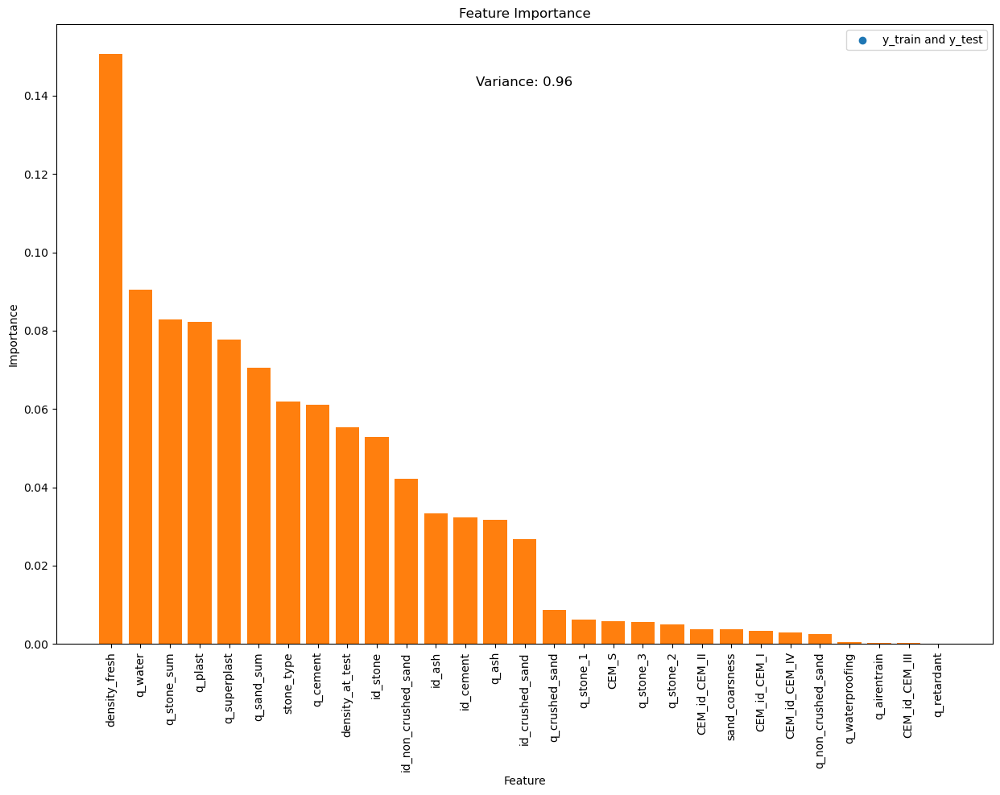

In [12]:
from data_analysis import data_processing
df = data_processing(df, target_column, target_column1)

In [13]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
# Splitting the data into features and target variable
X = df.drop('slump', axis=1)
y = df['slump']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Standardizing the features using StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Converting data to tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)

# Converting target variables to tensors and adding a dimension
y_train_tensor = torch.tensor(y_train.values, dtype=torch.float32).view(-1, 1)
y_test_tensor = torch.tensor(y_test.values, dtype=torch.float32).view(-1, 1)

# Defining the Deep Neural Network (DNN) model
class DNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(DNNModel, self).__init__()
        self.layer1 = nn.Linear(input_dim, hidden_dim)
        self.layer2 = nn.Linear(hidden_dim, hidden_dim)
        self.layer3 = nn.Linear(hidden_dim, output_dim)
        self.activation = nn.ReLU()

    def forward(self, x):
        x = self.activation(self.layer1(x))
        x = self.activation(self.layer2(x))
        x = self.layer3(x)
        return x

# Initializing the DNN model
input_dim = X_train.shape[1]
hidden_dim = 30
output_dim = 1
dnn_model = DNNModel(input_dim, hidden_dim, output_dim)

# Setting up optimizer and loss function
criterion = nn.MSELoss()
optimizer = optim.Adam(dnn_model.parameters(), lr=0.005, weight_decay=0.001, 
                       betas=(0.9, 0.999), eps=1e-08, amsgrad=False)

# Defining training parameters
epochs = 1000
batch_size = 64
losses = []

# Training the DNN model
for epoch in range(epochs):
    # Splitting the training dataset into batches
    for i in range(0, len(X_train_tensor), batch_size):
        inputs = X_train_tensor[i:i+batch_size]
        targets = y_train_tensor[i:i+batch_size]

        # Forward pass
        outputs = dnn_model(inputs)
        loss = criterion(outputs, targets)
        losses.append(loss.item())

        # Backpropagation and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

    # Printing loss every 100 epochs
    if epoch % 100 == 0:
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}")

# Convert the range to a list
epoch_list = list(range(epochs))

# Create the figure and add the trace
fig = go.Figure()
fig.add_trace(go.Scatter(x=epoch_list, y=losses, mode='lines', name='Loss'))

# Update layout and show the figure
fig.update_layout(title='Loss Curve', xaxis_title='Epochs', yaxis_title='Loss')
fig.show()

Epoch [1/1000], Loss: 68.2170
Epoch [101/1000], Loss: 0.6288
Epoch [201/1000], Loss: 0.3782
Epoch [301/1000], Loss: 0.2795
Epoch [401/1000], Loss: 0.2961
Epoch [501/1000], Loss: 0.2859
Epoch [601/1000], Loss: 0.2574
Epoch [701/1000], Loss: 0.2291
Epoch [801/1000], Loss: 0.1512
Epoch [901/1000], Loss: 0.1042


In [14]:
# 使用训练好的模型进行预测
y_pred = dnn_model(X_test_tensor)

# 计算均方误差
mse = mean_squared_error(y_test_tensor, y_pred.detach().numpy())
print(f"均方误差 (MSE): {mse:.4f}")

均方误差 (MSE): 1.5329


In [15]:
import torch
import torch.nn as nn
import torch.optim as optim
import plotly.graph_objects as go

# Define the Polynomial Regression model
class PolyModel(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(PolyModel, self).__init__()
        self.layer = nn.Linear(input_dim, output_dim)

    def forward(self, x):
        return self.layer(x)

# Initialize the models
input_dim = X_train.shape[1]
hidden_dim = 40
output_dim = 1
dnn_model = DNNModel(input_dim, hidden_dim, output_dim)
poly_model = PolyModel(input_dim, output_dim)

# Set optimizers and loss functions
criterion = nn.MSELoss()
dnn_optimizer = optim.Adam(dnn_model.parameters(), lr=0.005, weight_decay=0.001, betas=(0.9, 0.999), eps=1e-08, amsgrad=False)
poly_optimizer = optim.Adam(poly_model.parameters(), lr=0.005, weight_decay=0.001, betas=(0.9, 0.999), eps=1e-08, amsgrad=False)

epochs = 1000
batch_size = 32
losses = []

# Model training loop
for epoch in range(epochs):
    # Split the training set into batches
    for i in range(0, len(X_train_tensor), batch_size):
        inputs = X_train_tensor[i:i+batch_size]
        targets = y_train_tensor[i:i+batch_size]

        # Forward pass
        dnn_outputs = dnn_model(inputs)
        poly_outputs = poly_model(inputs)
        outputs = dnn_outputs + 0.2 * poly_outputs  # Joint training output

        loss = criterion(outputs, targets)
        losses.append(loss.item())

        # Backpropagation and optimization
        dnn_optimizer.zero_grad()
        poly_optimizer.zero_grad()
        loss.backward()
        dnn_optimizer.step()
        poly_optimizer.step()

    # Print loss every 100 epochs
    if epoch % 100 == 0:
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}")

# Convert the range to a list
epoch_list = list(range(epochs))

# Create the figure and add the trace
fig = go.Figure()
fig.add_trace(go.Scatter(x=epoch_list, y=losses, mode='lines', name='Loss'))

# Update layout and show the figure
fig.update_layout(title='Loss Curve', xaxis_title='Epochs', yaxis_title='Loss')
fig.show()

Epoch [1/1000], Loss: 25.1565
Epoch [101/1000], Loss: 0.6463
Epoch [201/1000], Loss: 0.5373
Epoch [301/1000], Loss: 0.4321
Epoch [401/1000], Loss: 0.3970
Epoch [501/1000], Loss: 0.3009
Epoch [601/1000], Loss: 0.1632
Epoch [701/1000], Loss: 0.2133
Epoch [801/1000], Loss: 0.1547
Epoch [901/1000], Loss: 0.1257


In [16]:
with torch.no_grad():
    dnn_outputs = dnn_model(X_test_tensor)
    poly_outputs = poly_model(X_test_tensor)
    y_pred = dnn_outputs + 0.2 * poly_outputs

y_pred = y_pred.numpy()
mse = mean_squared_error(y_test, y_pred)
mse 

1.3674466939433123